In [8]:
import numpy as np
import os, sys
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
from scipy.stats import ranksums, wilcoxon
from sklearn.cluster import KMeans
from statsmodels.multivariate.manova import MANOVA
from scipy.stats import spearmanr, linregress, wilcoxon
import seaborn as sns
from matplotlib.colors import ListedColormap
# flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
# my_cmap = ListedColormap(sns.color_palette(flatui).as_hex())
sns.set(font_scale=1.5, style='ticks')
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### mask cells

In [3]:
df = pd.read_csv('../Processing/data_list.csv')

In [11]:
row = df.iloc[5]
save_root = row['save_dir']+'/'
print(row['taskType'])
print(save_root)

LG_vs_NGGU
/nrs/ahrens/Ziqiang/Jing_Glia_project/Processed_data/20200105/fish01/6dpf_HuC-GC7FF_LGNGGU_fish01_exp02_20200105_164709//


In [12]:
_ = np.load(save_root+'cell_dff.npz', allow_pickle=True)
A = _['A']
A_loc = _['A_loc']
# dFF = _['dFF'].astype('float')
num_dff = _['dFF'].shape[-1]
_ = None

brain_map = np.load(save_root+'Y_ave.npy').astype('float').squeeze()
A_center = np.load(save_root+'cell_center.npy')
A_center_grid = np.round(A_center).astype('int')
cells_in_mask = []

for n_layer in range(brain_map.shape[0]):
    layer_ = A_center[:, 0]==n_layer
    cell_ids = np.where(layer_)[0]
    mask_ = brain_map[n_layer]>2
    y = A_center_grid[cell_ids, 2]
    x = A_center_grid[cell_ids, 1]
    x_max, y_max = mask_.shape
    num_cells = len(cell_ids)
    in_mask_ = np.zeros(num_cells).astype('bool')
    for n in range(num_cells):
        if (x[n]<x_max) and (y[n]<y_max):
            in_mask_[n] = mask_[x[n], y[n]]
    cells_in_mask.append(cell_ids[in_mask_])
cells_in_mask = np.concatenate(cells_in_mask)
A_center = A_center[cells_in_mask]
# dFF = dFF[cells_in_mask]
num_cells = A_center.shape[0]

### Precomptued neuron selectivity

In [13]:
### multi-pulse sensory
_ = np.load(save_root+'cell_type_stats_msensory.npz', allow_pickle=True)
cell_msensory_stats=_['cell_msensory_stats']

## sensory
_ = np.load(save_root+'cell_type_stats_sensory.npz', allow_pickle=True)
cell_sensory_stats=_['cell_sensory_stats']

if os.path.exists(save_root+'cell_type_stats_pulse_motor.npz'):
    _ = np.load(save_root+'cell_type_stats_pulse_motor.npz', allow_pickle=True)
    cell_pulse_motor_stats=_['cell_pulse_motor_stats']
    _ = np.load(save_root+'cell_comp_pulse_motor_stats_.npz', allow_pickle=True)
    cell_comp_pulse_motor_stats=_['cell_comp_pulse_motor_stats']

## motor
_ = np.load(save_root+'cell_type_stats_sm.npz', allow_pickle=True)
cell_sm_stats=_['cell_sm_stats']
_ = np.load(save_root+'cell_type_stats_motor.npz', allow_pickle=True)
cell_motor_stats=_['cell_motor_stats']

## Sensory neurons

In [14]:
mpulse_vec_sel = np.zeros(num_cells).astype('int')
mpulse_ave_sel_ = np.zeros(num_cells).astype('int')
mpulse_ave_sel_baseline = np.ones(num_cells).astype('int')
t_post = 50
t_pre = 5
t_len_ = t_post+t_pre

for n in range(num_cells):
    mpulse_vec_sel[n] = (cell_msensory_stats[n][1][0][t_pre:]<0.05).sum()
    mpulse_ave_sel_[n] = (cell_msensory_stats[n][1][1][t_pre:]<0.05).sum()
    mpulse_ave_sel_baseline[n] = (cell_msensory_stats[n][1][2][t_pre:]>0.1).sum()

In [20]:
win_ = 10
idx_base_ = (mpulse_ave_sel_>win_) & (mpulse_ave_sel_baseline>45)
idx_diff_ = (mpulse_vec_sel>win_) #& (mpulse_ave_sel_>win_)
arr_ = idx_base_ | idx_diff_ 

# pulse_itg = np.zeros(num_cells).astype('int')
# pulse_sign = np.zeros(num_cells).astype('int')
pulse_resp = np.zeros((num_cells, t_len_))
nopulse_resp = np.zeros((num_cells, t_len_))

for n in range(num_cells):
    pulse_resp[n] = cell_msensory_stats[n][3]
    nopulse_resp[n] = cell_msensory_stats[n][4]

In [21]:
print(arr_.sum(), arr_.mean())

5865 0.041532415111709096


In [22]:
pulse_resp_norm = pulse_resp[arr_]
pulse_resp_norm = pulse_resp_norm/np.abs(pulse_resp_norm).max(axis=-1, keepdims=True)
n_clusters = 15
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(pulse_resp_norm)
cluster_corr_thres = []
for n in range(n_clusters-1):
    corr_, p_val_ = spearmanr(pulse_resp_norm[kmeans.labels_==n], axis=1)
    cluster_corr_thres.append(corr_.mean())
corr_thres = np.mean(cluster_corr_thres)
labels = kmeans.labels_.copy()
for n in range(n_clusters-1):
    if (labels==n).sum()==0:
        continue
    if cluster_corr_thres[n]<corr_thres:
        continue
    for m in range(n+1, n_clusters):
        m_cell = (labels==m).sum()
        corr_, p_val_ = spearmanr(pulse_resp_norm[labels==m], pulse_resp_norm[labels==n], axis=1)
        if corr_[:m_cell, m_cell:].mean()>(cluster_corr_thres[n]*0.75):
            labels[labels==m]=n
ulabels = np.unique(labels)
for n, l in enumerate(ulabels):
    labels[labels==l]=n
m_clusters = len(ulabels)
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters).as_hex())

In [23]:
index_start = t_pre+np.arange(0, t_post, 6)
index_peak = t_pre+np.arange(3, t_post, 6)
index_start = index_start[:len(index_peak)]
labels_ = labels.copy()
for n in range(m_clusters):
    act_list = pulse_resp[arr_][labels==n]-nopulse_resp[arr_][labels==n]
    act_ = np.mean(act_list/act_list.std(axis=-1, keepdims=True),axis=0)
    act_list = pulse_resp[arr_][labels==n]
    act__ = np.mean(act_list/act_list.std(axis=-1, keepdims=True),axis=0)
    postive_pulse = (act_[index_peak] - act_[index_start]).sum()>0
    if not postive_pulse:
        labels_[labels==n] = 3
        continue
    _, pval_ = wilcoxon(act_[index_start])
    if (pval_>0.1):
        labels_[labels==n] = 0
        continue
    if act_[index_start].sum()>0:
        labels_[labels==n] = 1
    else:
        labels_[labels==n] = 2
l, cnt = np.unique(labels, return_counts=True)
labels_[labels==l[np.argmax(cnt)]] = 0

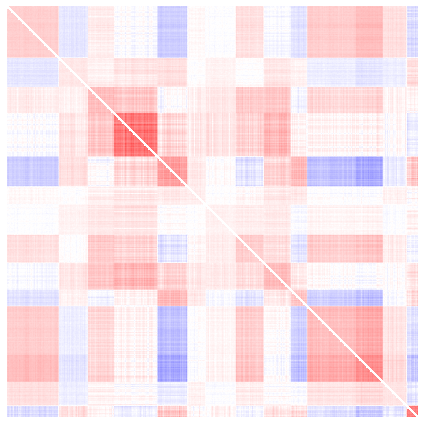

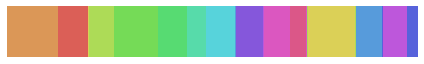

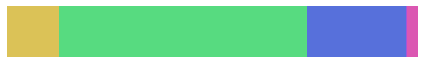

In [24]:
sort_ind = np.argsort(labels_*(labels.max()+1)+labels)
corr_, p_val_ = spearmanr(pulse_resp_norm[sort_ind], axis=1)
np.fill_diagonal(corr_, np.nan)
# corr_[p_val_>0.05]=0

m_clusters = len(ulabels)
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters).as_hex())
plt.figure(figsize=(6, 6))
plt.imshow(corr_, vmax=1, vmin=-1, cmap=plt.cm.bwr)
plt.axis('off')
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 1))
plt.imshow(labels[None,sort_ind], cmap=my_cmap, aspect='auto')
plt.axis('off')
plt.tight_layout()
plt.show()

m_clusters = len(np.unique(labels_))
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters*2).as_hex())
plt.figure(figsize=(6, 1))
plt.imshow(labels_[None,sort_ind]*2+1, cmap=my_cmap, aspect='auto', vmin=0, vmax=m_clusters*2-1)
plt.axis('off')
plt.tight_layout()
plt.show()

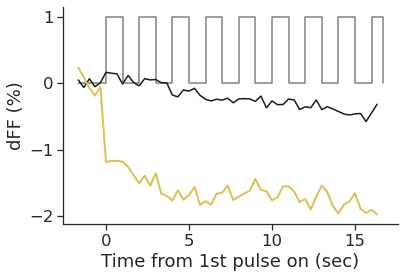

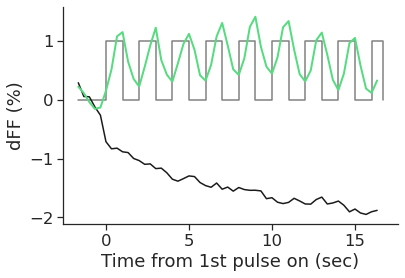

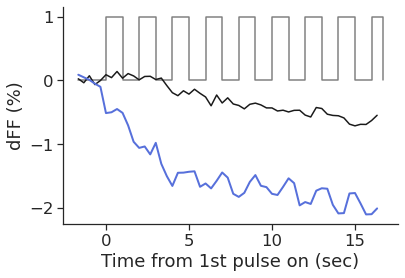

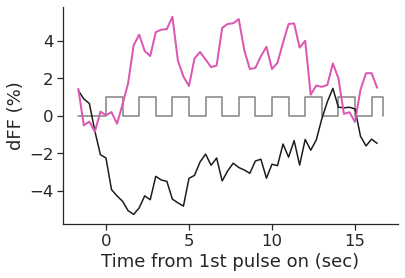

In [25]:
m_clusters = len(np.unique(labels_))
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters*2).as_hex())
pulse_t = np.r_[-t_pre/3, np.arange(t_post/3), t_post/3]
pulse_a = np.r_[0, (np.arange(t_post/3)+1)%2, (np.rint(t_post/3)+1)%2]
for m in range(m_clusters):
    plt.step(pulse_t, pulse_a, c='gray', where='post')
    plt.plot(np.arange(-t_pre, t_post)/3, np.mean(nopulse_resp[arr_][labels_==m],axis=0)*100, '-k')
    plt.plot(np.arange(-t_pre, t_post)/3, np.mean(pulse_resp[arr_][labels_==m],axis=0)*100, '-', c=my_cmap.colors[m*2+1], lw=2)
#     plt.plot(np.arange(-t_pre, t_post)/3, pulse_resp[arr_][labels==m].T*100, '-', c=my_cmap.colors[m], lw=2)
    plt.ylabel('dFF (%)')
    plt.xlabel('Time from 1st pulse on (sec)')
    sns.despine()
    plt.show()

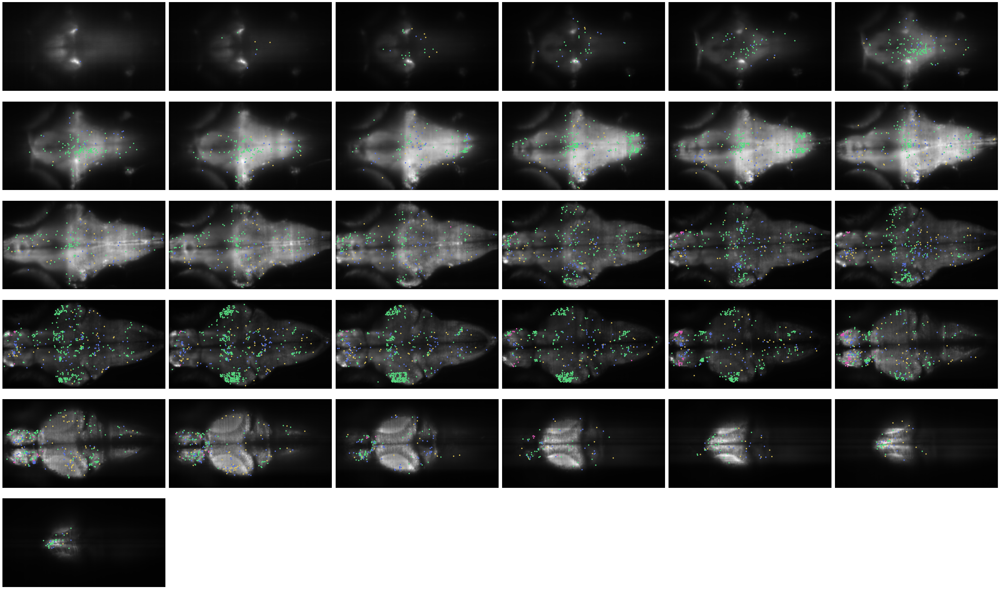

In [26]:
m_clusters = len(np.unique(labels_))
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters*2).as_hex())
mpulse_ = arr_.copy()
mpulse_labels = labels_.copy()
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
A_center_ = A_center[mpulse_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], c=labels_[idx_]*2+1, cmap=my_cmap, vmin=0, vmax=m_clusters*2-1, s=8)
#     idx_ = layer_ & (pulse_sign<0)
#     ax[n_layer].plot(A_center[idx_, 2], A_center[idx_, 1], '.r', alpha=0.5)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

## Motor neurons

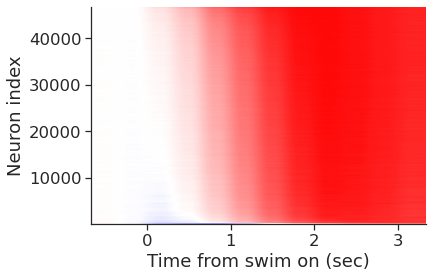

In [27]:
pre_len = 2
swim_len = cell_motor_stats[0][3].shape[0]-pre_len
swim_vec_sel = np.zeros(num_cells).astype('int')
swim_ave_sel_baseline = np.zeros(num_cells).astype('int')
swim_ave_sel_ = np.zeros(num_cells).astype('int')

for n in range(num_cells):
    swim_vec_sel[n] = (cell_motor_stats[n][1][0][pre_len:]<0.05).sum()
    swim_ave_sel_[n] = (cell_motor_stats[n][1][1][pre_len:]<0.05).sum()
    swim_ave_sel_baseline[n] = (cell_motor_stats[n][1][2][pre_len:]>0.05).sum()
    
arr_ = (swim_vec_sel>4) & (swim_ave_sel_>4) & (swim_ave_sel_baseline>8)
motor_resp = np.zeros((num_cells, swim_len+pre_len))
nomotor_resp = np.zeros((num_cells, swim_len+pre_len))

for n in range(num_cells):
    motor_resp[n] = cell_motor_stats[n][3]
    nomotor_resp[n] = cell_motor_stats[n][4]

motor_resp_norm = motor_resp[arr_]
motor_resp_norm = motor_resp_norm/np.abs(motor_resp_norm).max(axis=-1, keepdims=True)
sort_ord = np.argsort(motor_resp_norm.sum(axis=-1))
plt.imshow(motor_resp_norm[sort_ord[::-1]], aspect='auto', vmax=1, vmin=-1, cmap=plt.cm.bwr, extent=(-pre_len/3, swim_len/3, 1, len(sort_ord)))
plt.ylabel('Neuron index')
plt.xlabel('Time from swim on (sec)')
sns.despine()
plt.show()

In [28]:
motor_neuron = arr_.sum()
labels=np.zeros(motor_neuron)
cell_motor_stats_ = cell_motor_stats[arr_]
for n in range(motor_neuron):
    swim_ave_sel_ = cell_motor_stats_[n][1][1]<0.05
    motor_resp_ = cell_motor_stats_[n][3]
    if (motor_resp_[pre_len+3:]<0).sum()>=4:
        labels[n] =4
        continue
    if (motor_resp_[pre_len:pre_len+3][swim_ave_sel_[pre_len:pre_len+3]]<0).sum()>0:
        labels[n] = 3
        continue
    if (swim_ave_sel_[:pre_len+4].sum()==0):
        labels[n] = 2
        continue
    if (swim_ave_sel_[:pre_len+2].sum()==0):
        labels[n] = 1
        continue

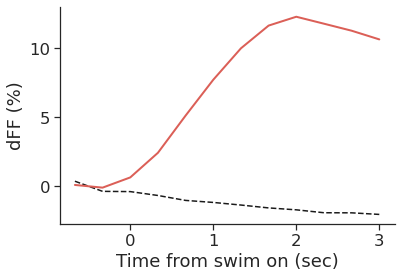

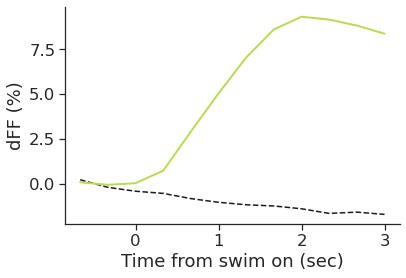

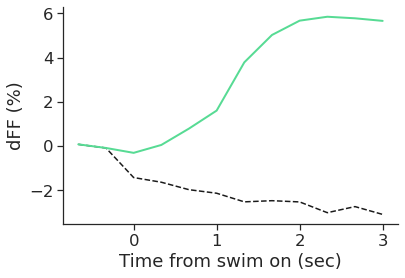

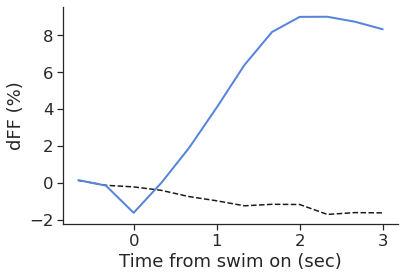

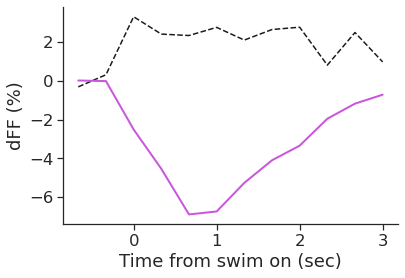

In [29]:
m_clusters = labels.max().astype('int')+1
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters).as_hex())
for m in range(m_clusters):
    plt.plot(np.arange(-pre_len, swim_len)/3, np.mean(nomotor_resp[arr_][labels==m],axis=0)*100, '--k')
    plt.plot(np.arange(-pre_len, swim_len)/3, np.mean(motor_resp[arr_][labels==m],axis=0)*100, '-', c=my_cmap.colors[m], lw=2)
    plt.ylabel('dFF (%)')
    plt.xlabel('Time from swim on (sec)')
    sns.despine()
    plt.show()

In [30]:
np.unique(labels, return_counts=True)

(array([0., 1., 2., 3., 4.]), array([19254, 25720,   769,  1006,    52]))

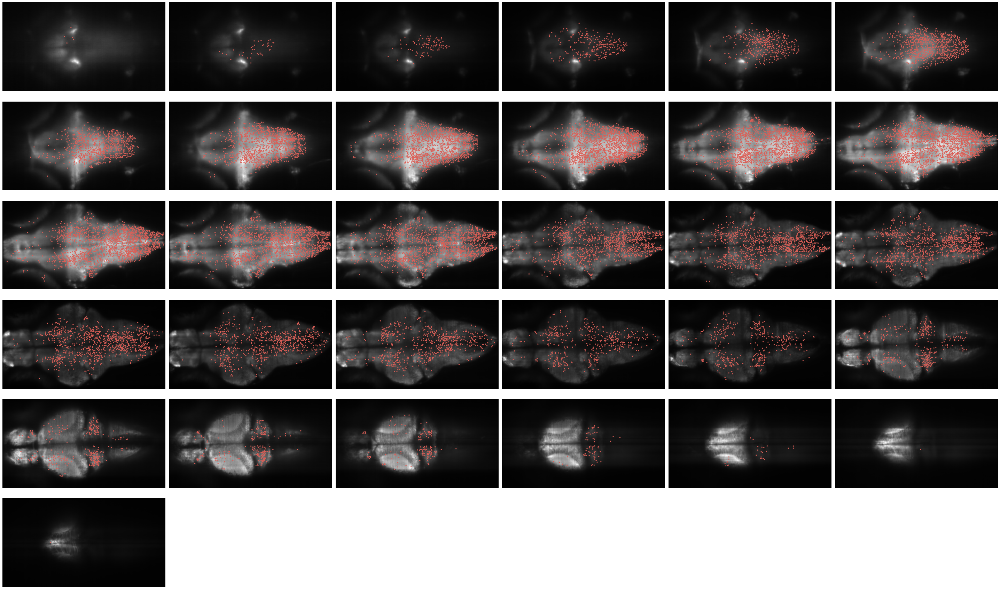

In [31]:
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
motor_ = arr_.copy()
motor_labels = labels.copy()
A_center_ = A_center[arr_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_ & (labels==0)
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], c=labels[idx_], cmap=my_cmap, s=5, vmax=m_clusters-1, vmin=0)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

## Mixed cells

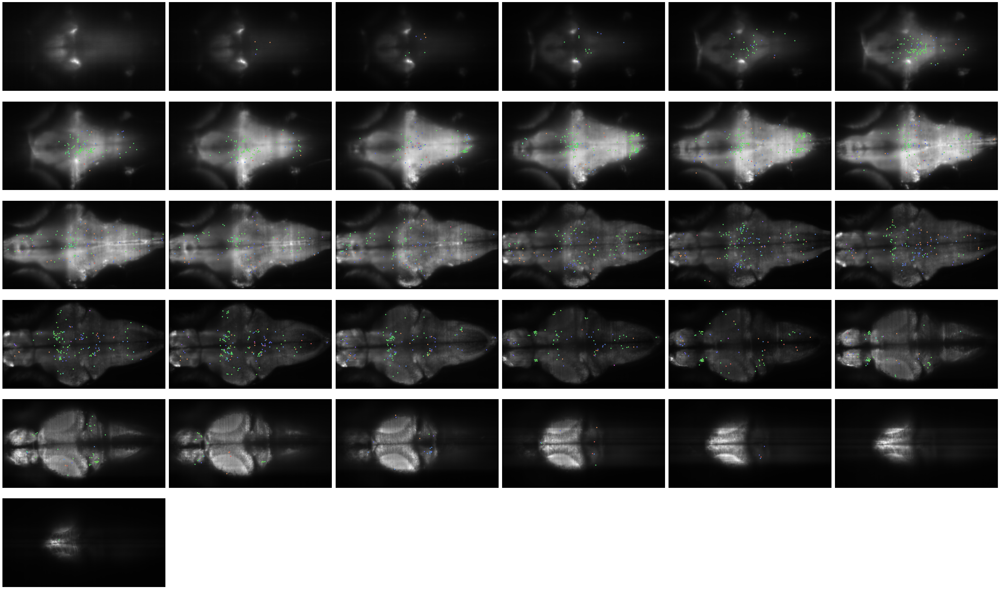

In [32]:
mix_ = mpulse_ & motor_
_mpulse_labels = np.zeros(num_cells)
_mpulse_labels[:] = np.nan
_mpulse_labels[mpulse_] = mpulse_labels
_motor_labels = np.zeros(num_cells)
_motor_labels[:] = np.nan
_motor_labels[motor_] = motor_labels
mix_labels = _mpulse_labels * (motor_labels.max()+1) + _motor_labels
mix_labels = mix_labels[mix_]

m_clusters = mix_labels[~np.isnan(mix_labels)].max().astype('int')+1
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters).as_hex())

fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
A_center_ = A_center[mix_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], c=mix_labels[idx_], cmap=my_cmap, s=5, vmax=m_clusters-1, vmin=0)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

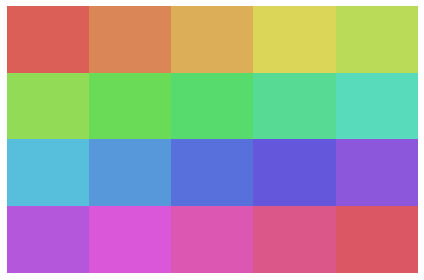

In [33]:
a_matrix = np.arange((mpulse_labels.max()+1)*(motor_labels.max()+1)).reshape(-1, motor_labels.max().astype(int)+1)

m_clusters = a_matrix.max().astype(int)+1
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters*2).as_hex())
plt.figure(figsize=(6, 4))
plt.imshow(a_matrix, cmap=my_cmap, aspect='auto', vmin=0, vmax=m_clusters-1)
plt.axis('off')
plt.tight_layout()
plt.show()

In [34]:
ll, cnt = np.unique(mix_labels, return_counts=True)
print(cnt, ll[cnt<100])

[ 82 161   3   8 655 669  10  27 235 351  14  22   1   9] [ 0.  2.  3.  7.  8. 12. 13. 14. 16.]


## Conditional motor neurons

In [42]:
mix_motor_resp = np.zeros((num_cells, swim_len+pre_len))
mix_nomotor_resp = np.zeros((num_cells, swim_len+pre_len))

for n in range(num_cells):
    mix_motor_resp[n] = cell_sm_stats[n][3]
    mix_nomotor_resp[n] = cell_sm_stats[n][4]

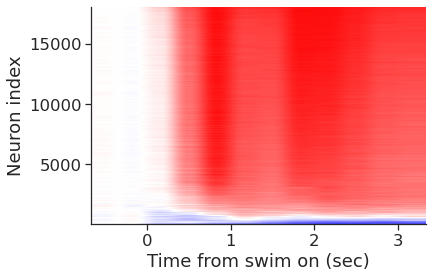

In [43]:
pre_len = 2
swim_len = cell_sm_stats[0][3].shape[0]-pre_len
mswim_vec_sel = np.zeros(num_cells).astype('int')
mswim_ave_sel_baseline = np.zeros(num_cells).astype('int')
mswim_ave_sel_ = np.zeros(num_cells).astype('int')

for n in range(num_cells):
    mswim_vec_sel[n] = (cell_sm_stats[n][1][0][pre_len:]<0.05).sum()
    mswim_ave_sel_[n] = (cell_sm_stats[n][1][1][pre_len:]<0.05).sum()
    mswim_ave_sel_baseline[n] = (cell_sm_stats[n][1][2][pre_len:]>0.05).sum()
    
arr_ = (mswim_vec_sel>2) #& (mswim_ave_sel_>2) & (mswim_ave_sel_baseline>2)
mmotor_resp = np.zeros((num_cells, swim_len+pre_len))
mnomotor_resp = np.zeros((num_cells, swim_len+pre_len))

for n in range(num_cells):
    mmotor_resp[n] = cell_sm_stats[n][3]
    mnomotor_resp[n] = cell_sm_stats[n][4]

mmotor_resp_norm = mmotor_resp[arr_]
mmotor_resp_norm = mmotor_resp_norm/np.abs(mmotor_resp_norm).max(axis=-1, keepdims=True)
sort_ord = np.argsort(mmotor_resp_norm.sum(axis=-1))
plt.imshow(mmotor_resp_norm[sort_ord[::-1]], aspect='auto', vmax=1, vmin=-1, cmap=plt.cm.bwr, extent=(-pre_len/3, swim_len/3, 1, len(sort_ord)))
plt.ylabel('Neuron index')
plt.xlabel('Time from swim on (sec)')
sns.despine()
plt.show()


# plt.imshow(pulse_resp_norm[sort_ord[::-1], (t_pre-pre_len+1):(t_pre+swim_len+1)], aspect='auto', vmax=1, vmin=-1, cmap=plt.cm.bwr, extent=(-pre_len/3, swim_len/3, 1, len(sort_ord)))
# plt.ylabel('Neuron index')
# plt.xlabel('Time from swim on (sec)')
# sns.despine()
# plt.show()

In [44]:
mmotor_neuron = arr_.sum()
labels=np.zeros(mmotor_neuron)
cell_motor_stats_ = cell_sm_stats[arr_]
for n in range(mmotor_neuron):
    swim_ave_sel_ = cell_motor_stats_[n][1][1]<0.05
    mmotor_resp_ = cell_motor_stats_[n][3]
    if (mmotor_resp_[pre_len+4:]<0).sum()>=4:
        labels[n] =2
        continue
    if (mmotor_resp_[pre_len:pre_len+4][swim_ave_sel_[pre_len:pre_len+4]]<0).sum()>0:
        labels[n] = 1
        continue

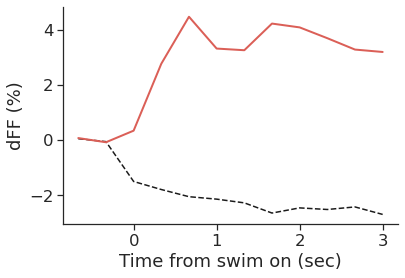

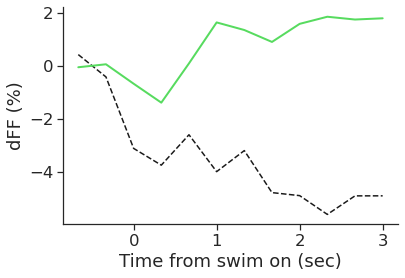

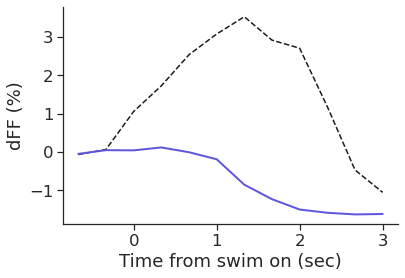

In [45]:
m_clusters = labels.max().astype('int')+1
my_cmap = ListedColormap(sns.color_palette("hls", m_clusters).as_hex())
for m in range(m_clusters):
    plt.plot(np.arange(-pre_len, swim_len)/3, np.mean(mnomotor_resp[arr_][labels==m],axis=0)*100, '--k')
    plt.plot(np.arange(-pre_len, swim_len)/3, np.mean(mmotor_resp[arr_][labels==m],axis=0)*100, '-', c=my_cmap.colors[m], lw=2)
    plt.ylabel('dFF (%)')
    plt.xlabel('Time from swim on (sec)')
    sns.despine()
    plt.show()

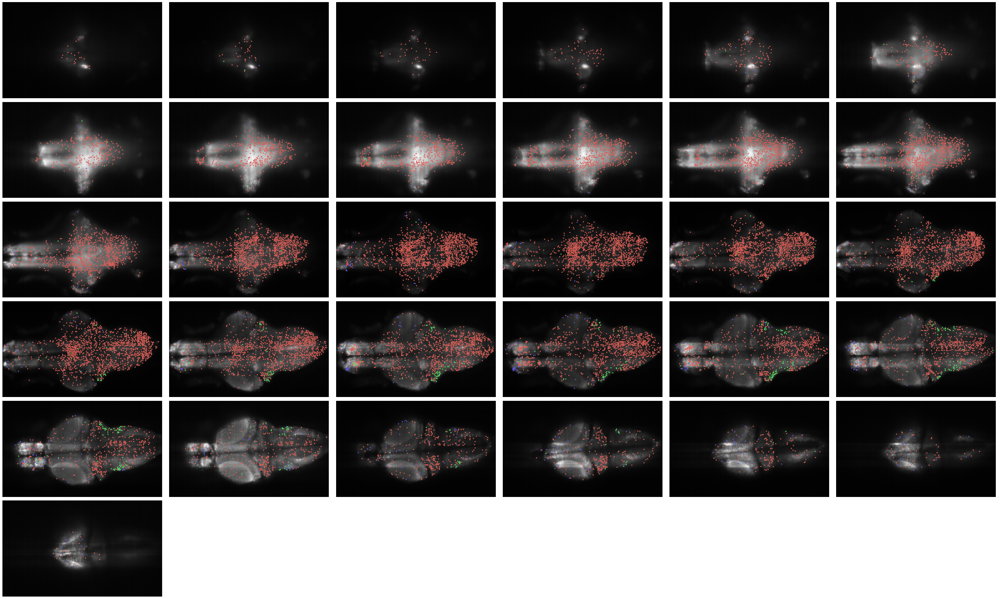

In [46]:
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
A_center_ = A_center[arr_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], c=labels[idx_], cmap=my_cmap, s=5, vmax=m_clusters-1, vmin=0)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

In [47]:
arr_ = cond_ & (~mpulse_) & (~motor_)
my_cmap = ListedColormap(sns.color_palette("hls", 3).as_hex())
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
A_center_ = A_center[arr_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], cmap=my_cmap, s=5, vmax=2, vmin=0)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()
print(arr_.sum())

NameError: name 'cond_' is not defined

In [ ]:
_mpulse_labels = np.zeros(num_cells)
_mpulse_labels[:] = np.nan
_mpulse_labels[mpulse_] = mpulse_labels
_motor_labels = np.zeros(num_cells)
_motor_labels[:] = np.nan
_motor_labels[motor_] = motor_labels

# positive visual
pos_vis = _mpulse_labels<3
# negative visual
neg_vis = _mpulse_labels==3

# postive motor
pos_motor = _motor_labels<3

# biphasic motor 
bi_motor = _motor_labels==3

neg_motor = _motor_labels==4

In [ ]:
cond_labels = labels.copy()
cond_ = arr_.copy()
_cond_labels = np.zeros(num_cells)
_cond_labels[:] = np.nan
_cond_labels[cond_] = cond_labels

In [ ]:
pos_motor.sum(), bi_motor.sum(), neg_motor.sum()

In [ ]:
# category changing cells
cat_vis_labels = np.zeros(num_cells)
cat_vis_labels[:] = np.nan
cat_motor_labels = np.zeros(num_cells)
cat_motor_labels[:] = np.nan
cat_vis_labels[pos_vis & (_cond_labels==0) & (~pos_motor) & (~bi_motor) & mpulse_] = 0
cat_vis_labels[neg_vis & (_cond_labels==2) & (~neg_motor) & mpulse_] = 1
cat_motor_labels[(~pos_motor) & (_cond_labels==0) & motor_] = 0
cat_motor_labels[(~bi_motor) & (_cond_labels==1) & motor_] = 1
cat_motor_labels[(~neg_motor) & (_cond_labels==2) & motor_] = 2

In [ ]:
np.unique(cat_vis_labels, return_counts=True)

In [ ]:
my_cmap = ListedColormap(sns.color_palette("hls", 3).as_hex())
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
A_center_ = A_center[arr_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], c=cat_vis_labels[cond_][idx_], cmap=my_cmap, s=5, vmax=2, vmin=0)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

In [ ]:
np.unique(cat_motor_labels, return_counts=True)

In [ ]:
my_cmap = ListedColormap(sns.color_palette("hls", 3).as_hex())
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
A_center_ = A_center[arr_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], c=cat_motor_labels[cond_][idx_], cmap=my_cmap, s=5, vmax=2, vmin=0)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 24))
ax = ax.flatten()
size_ = np.ones(num_cells)*10
A_center_ = A_center[arr_]
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center_[:, 0]==n_layer    
    idx_ = layer_
    ax[n_layer].scatter(A_center_[idx_, 2], A_center_[idx_, 1], cmap=my_cmap, s=5, vmax=m_clusters-1, vmin=0)
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

In [ ]:
mix_vec_sel = np.zeros(num_cells).astype('bool')
mix_ave_sel_baseline = np.zeros(num_cells).astype('bool')

for n in range(num_cells):
    mix_vec_sel[n] = (cell_sm_stats[n][1][0][pre_len:]<0.05).sum()>=2
    mix_ave_sel_baseline[n] = (cell_sm_stats[n][1][2][2:]>0.05).sum()>=(swim_len-2)

swim_mix_itg = np.zeros(num_cells).astype('int')
swim_mix_sign = np.zeros(num_cells).astype('int')

for n in range(num_cells):
    if mix_vec_sel[n] & mix_ave_sel_baseline[n]:
        _ = cell_sm_stats[n][3]
        if _[3:].sum()>0:
            swim_mix_sign[n] = 1
        if _[3:].sum()<0:
            swim_mix_sign[n] = -1
        swim_mix_itg[n] = (cell_sm_stats[n][1][0][3:]<0.05).sum()

## Active vs Passive cells

In [7]:
for ind, row in df.iterrows():
    save_root = row['save_dir']+'/'
    n = []
    ## active vs passive
    if os.path.exists(save_root+'cell_no_pulse_ap_stats.npz'):
        n.append(1)

    if os.path.exists(save_root+'cell_pulse_ap_stats.npz'):
        n.append(2)

    if os.path.exists(save_root+'cell_no_swim_ap_stats.npz'):
        n.append(3)

    if os.path.exists(save_root+'cell_pulse_swim_ap_stats.npz'):
        n.append(4)
    print(ind, n)

0 [2]
1 [2]
2 [1, 2, 4]
3 [2]
4 [1, 2, 3, 4]
5 [1, 2, 3, 4]
6 [1, 2]
7 []
8 []
9 [1, 3]
10 []
11 []
12 []
13 []
14 []
15 []
16 []
17 []
18 []
19 []
20 []
21 []
22 []
23 []
24 []
25 []
26 []
27 []
28 []
29 []
30 []
31 []
32 []
33 []
34 []
35 [1, 2, 4]
36 [1, 2]
37 [1, 2]
38 [1, 2]
39 []


In [35]:
row = df.iloc[5]
save_root = row['save_dir']+'/'
## active vs passive
if os.path.exists(save_root+'cell_no_pulse_ap_stats.npz'):
    _ = np.load(save_root+'cell_no_pulse_ap_stats.npz', allow_pickle=True)
    cell_no_pulse_ap_stats=_['cell_no_pulse_ap_stats']
    print('cell_no_pulse_ap_stats')

if os.path.exists(save_root+'cell_pulse_ap_stats.npz'):
    _ = np.load(save_root+'cell_pulse_ap_stats.npz', allow_pickle=True)
    cell_pulse_ap_stats=_['cell_pulse_ap_stats']
    print('cell_pulse_ap_stats')

if os.path.exists(save_root+'cell_no_swim_ap_stats.npz'):
    _ = np.load(save_root+'cell_no_swim_ap_stats.npz', allow_pickle=True)
    cell_no_swim_ap_stats=_['cell_no_swim_ap_stats']
    print('cell_no_swim_ap_stats')

if os.path.exists(save_root+'cell_pulse_swim_ap_stats.npz'):
    _ = np.load(save_root+'cell_pulse_swim_ap_stats.npz', allow_pickle=True)
    cell_pulse_swim_ap_stats=_['cell_pulse_swim_ap_stats']
    print('cell_pulse_swim_ap_stats')

cell_no_pulse_ap_stats
cell_pulse_ap_stats
cell_no_swim_ap_stats
cell_pulse_swim_ap_stats


In [36]:
dat_stats = cell_no_pulse_ap_stats
t_pre = 5
t_post = 50

pulse_active_vec_sel = np.zeros(num_cells).astype('int')

for n in range(num_cells):
    pulse_active_vec_sel[n] = (dat_stats[n][0][0][3:]<0.05).sum()
    
arr_ = pulse_active_vec_sel>6

active_resp = np.zeros((num_cells, t_pre+t_post))
passive_resp = np.zeros((num_cells, t_pre+t_post))

for n in range(num_cells):
    active_resp[n] = dat_stats[n][1]
    passive_resp[n] = dat_stats[n][2]

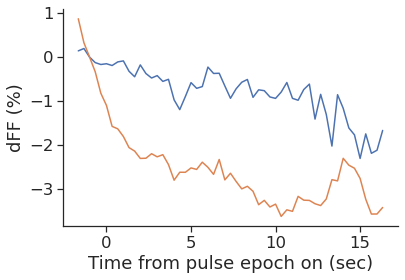

In [37]:
arr_ = pulse_active_vec_sel>=8
plt.plot(np.arange(-t_pre, t_post)/3,active_resp[arr_ & mpulse_].mean(axis=0)*100)
plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[arr_ & mpulse_].mean(axis=0)*100)
plt.ylabel('dFF (%)')
plt.xlabel('Time from pulse epoch on (sec)')
sns.despine()
plt.show()

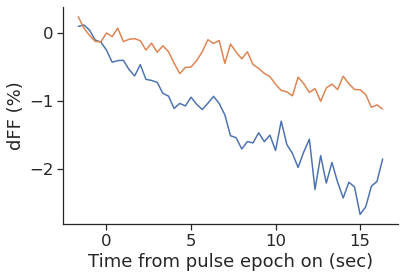

In [38]:
plt.plot(np.arange(-t_pre, t_post)/3,active_resp[arr_ & motor_].mean(axis=0)*100)
plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[arr_ & motor_].mean(axis=0)*100)
plt.ylabel('dFF (%)')
plt.xlabel('Time from pulse epoch on (sec)')
sns.despine()
plt.show()

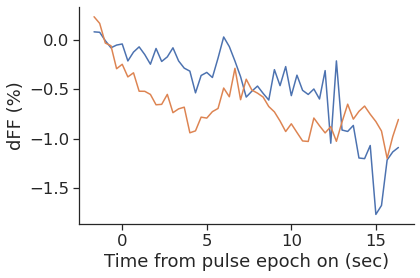

In [39]:
plt.plot(np.arange(-t_pre, t_post)/3,active_resp[arr_ & ~motor_ & ~mpulse_].mean(axis=0)*100)
plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[arr_ & ~motor_ & ~mpulse_].mean(axis=0)*100)
plt.ylabel('dFF (%)')
plt.xlabel('Time from pulse epoch on (sec)')
sns.despine()
plt.show()

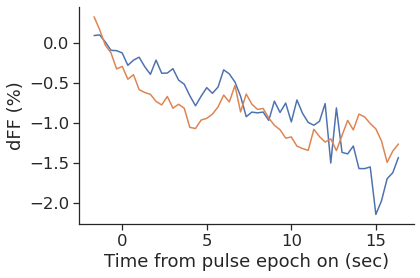

In [40]:
plt.plot(np.arange(-t_pre, t_post)/3,active_resp[arr_].mean(axis=0)*100)
plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[arr_].mean(axis=0)*100)
plt.ylabel('dFF (%)')
plt.xlabel('Time from pulse epoch on (sec)')
sns.despine()
plt.show()

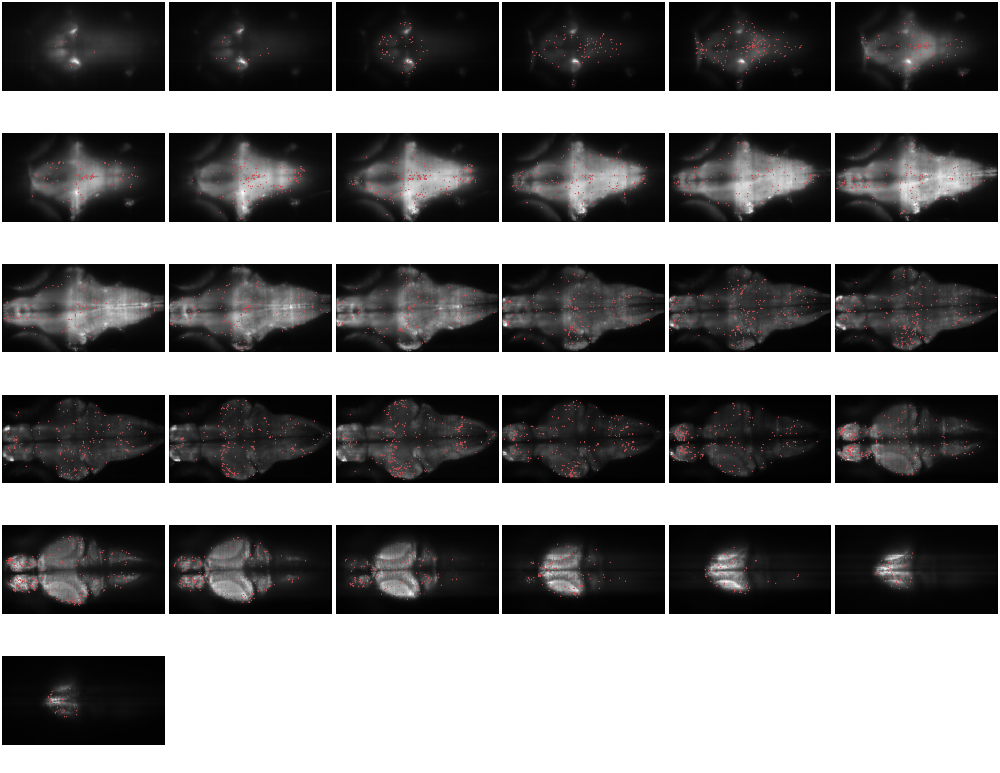

In [41]:
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 32))
ax = ax.flatten()
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center[:, 0]==n_layer    
    ax[n_layer].plot(A_center[arr_ & layer_, 2], A_center[arr_ & layer_, 1], '.r', alpha=0.8)
    
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

In [42]:
dat_stats = cell_pulse_ap_stats
t_pre = 5
t_post = 50

pulse_active_vec_sel = np.zeros(num_cells).astype('int')

for n in range(num_cells):
    pulse_active_vec_sel[n] = (dat_stats[n][0][0][3:]<0.05).sum()
    
arr_ = pulse_active_vec_sel>6

active_resp = np.zeros((num_cells, t_pre+t_post))
passive_resp = np.zeros((num_cells, t_pre+t_post))

for n in range(num_cells):
    active_resp[n] = dat_stats[n][1]
    passive_resp[n] = dat_stats[n][2]

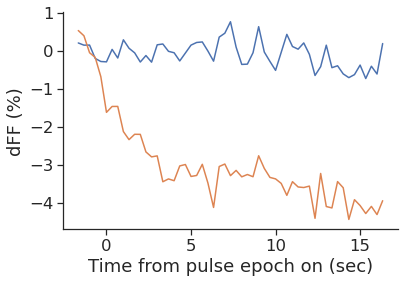

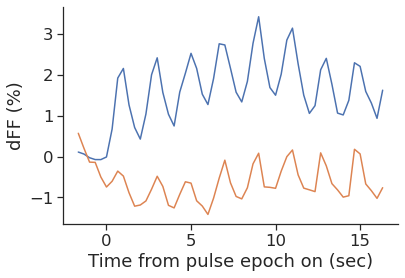

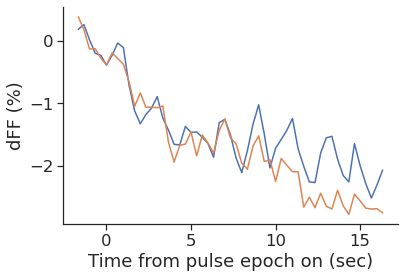

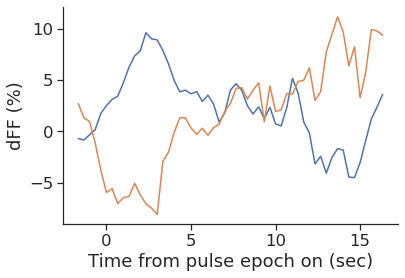

In [43]:
for m in range(4):
    plt.plot(np.arange(-t_pre, t_post)/3,active_resp[(_mpulse_labels==m) & arr_].mean(axis=0)*100)
    plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[(_mpulse_labels==m) & arr_].mean(axis=0)*100)
    plt.ylabel('dFF (%)')
    plt.xlabel('Time from pulse epoch on (sec)')
    sns.despine()
    plt.show()

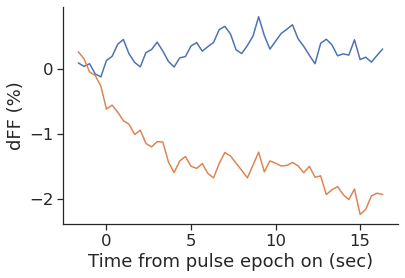

In [44]:
plt.plot(np.arange(-t_pre, t_post)/3,active_resp[~motor_ & ~mpulse_ & arr_].mean(axis=0)*100)
plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[~motor_ & ~mpulse_ & arr_].mean(axis=0)*100)
plt.ylabel('dFF (%)')
plt.xlabel('Time from pulse epoch on (sec)')
sns.despine()
plt.show()

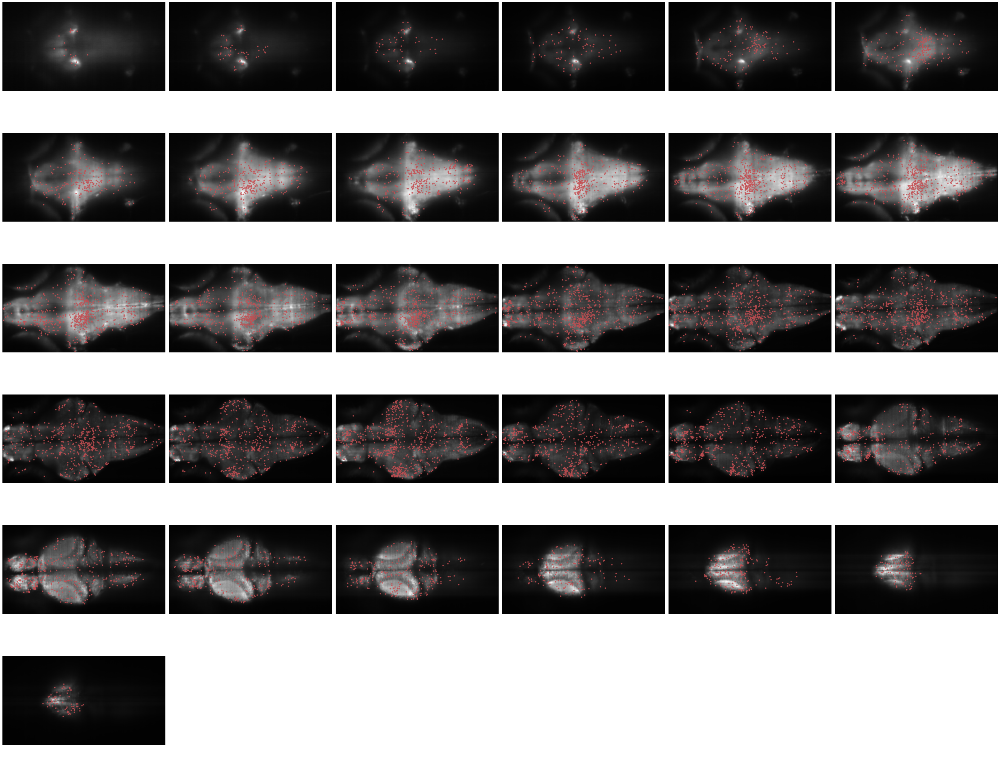

In [45]:
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 32))
ax = ax.flatten()
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center[:, 0]==n_layer    
    ax[n_layer].plot(A_center[arr_ & layer_, 2], A_center[arr_ & layer_, 1], '.r', alpha=0.8)
    
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

In [53]:
dat_stats = cell_no_swim_ap_stats
# dat_stats = cell_pulse_swim_ap_stats
t_pre = 5
t_post = 10

pulse_active_vec_sel = np.zeros(num_cells).astype('int')

for n in range(num_cells):
    pulse_active_vec_sel[n] = (dat_stats[n][0][0][3:]<0.05).sum()
    
arr_ = pulse_active_vec_sel>6

active_resp = np.zeros((num_cells, t_pre+t_post))
passive_resp = np.zeros((num_cells, t_pre+t_post))

for n in range(num_cells):
    active_resp[n] = dat_stats[n][1]
    passive_resp[n] = dat_stats[n][2]

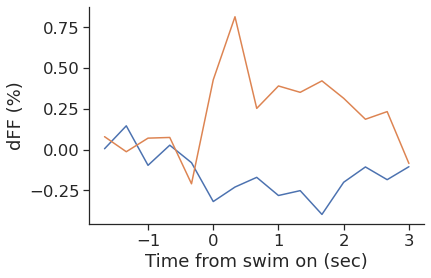

In [54]:
arr_ = pulse_active_vec_sel>=3
plt.plot(np.arange(-t_pre, t_post)/3,active_resp[arr_ & ~motor_ & ~mpulse_].mean(axis=0)*100)
plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[arr_ & ~motor_ & ~mpulse_].mean(axis=0)*100)
plt.ylabel('dFF (%)')
plt.xlabel('Time from swim on (sec)')
sns.despine()
plt.show()

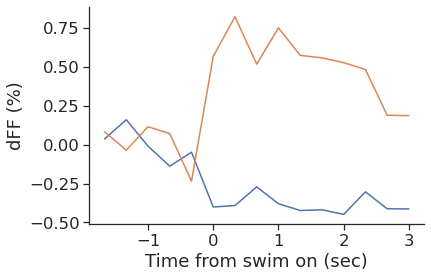

In [55]:
arr_ = pulse_active_vec_sel>=3
plt.plot(np.arange(-t_pre, t_post)/3,active_resp[arr_ & motor_ & ~mpulse_].mean(axis=0)*100)
plt.plot(np.arange(-t_pre, t_post)/3,passive_resp[arr_ & motor_ & ~mpulse_].mean(axis=0)*100)
plt.ylabel('dFF (%)')
plt.xlabel('Time from swim on (sec)')
sns.despine()
plt.show()

In [49]:
dat_stats = cell_no_swim_ap_stats
t_pre = 5
t_post = 10
pulse_active_vec_sel = np.zeros(num_cells).astype('int')
for n in range(num_cells):
    pulse_active_vec_sel[n] = (dat_stats[n][0][0][3:]<0.05).sum()
    
arr1_ = pulse_active_vec_sel>=3

dat_stats = cell_pulse_swim_ap_stats
t_pre = 5
t_post = 10
pulse_active_vec_sel = np.zeros(num_cells).astype('int')
for n in range(num_cells):
    pulse_active_vec_sel[n] = (dat_stats[n][0][0][3:]<0.05).sum()
    
arr2_ = pulse_active_vec_sel>=3

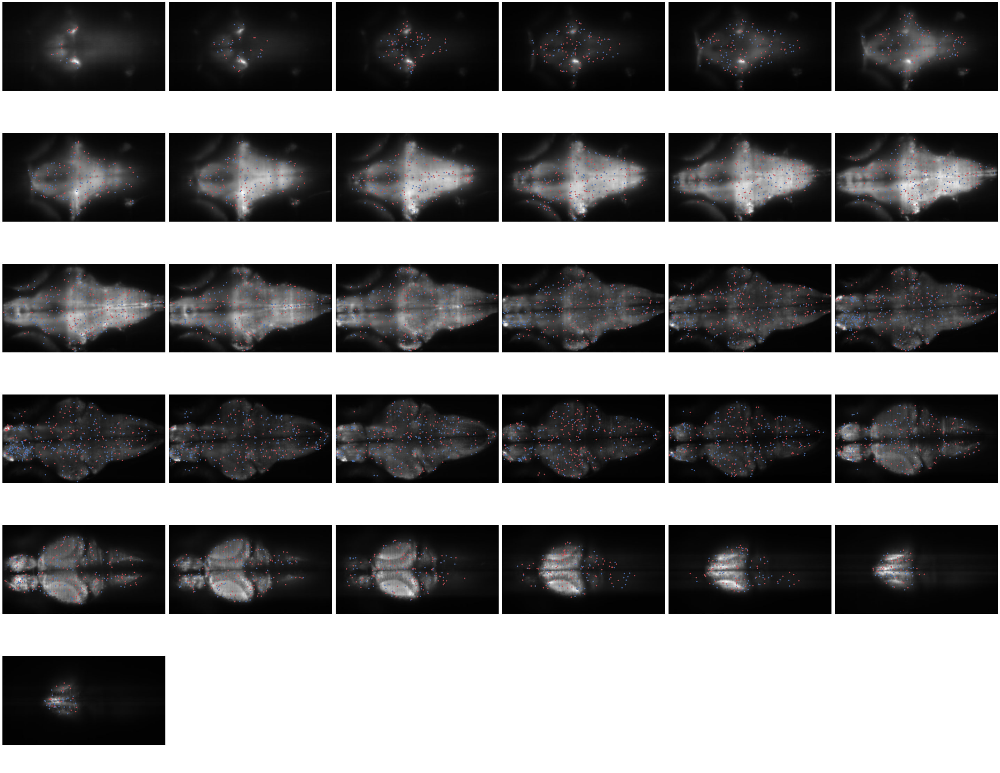

In [50]:
fig, ax = plt.subplots(6, brain_map.shape[0]//6+1, figsize=(40, 32))
ax = ax.flatten()
for n_layer in range(brain_map.shape[0]):
    ax[n_layer].imshow(brain_map[n_layer], cmap='gray')
    layer_ = A_center[:, 0]==n_layer    
    ax[n_layer].plot(A_center[arr1_ & layer_, 2], A_center[arr1_ & layer_, 1], '.r', alpha=0.8)
    ax[n_layer].plot(A_center[arr2_ & layer_, 2], A_center[arr2_ & layer_, 1], '.b', alpha=0.8)
    
[_.set_axis_off() for _ in ax]
plt.tight_layout()
plt.show()

## probability map

In [18]:
# from sklearn.gaussian_process import GaussianProcessClassifier
# from sklearn.gaussian_process.kernels import RBF

# n_layer = 20
# layer_ = A_center[:, 0]==n_layer    
# x_ = A_center[layer_, 2][:, None]
# y_ = A_center[layer_, 1][:, None]
# gp_target_ = pulse_active_vec_sel[layer_][:, None]
# loc_ = np.hstack([x_, y_])

# h = .02  # step size in the mesh
# kernel = 1.0 * RBF([1.0, 1.0])
# gpc_rbf_anisotropic = GaussianProcessClassifier(kernel=kernel).fit(loc_, gp_target_)
# # create a mesh to plot in
# x_min, x_max = (0, brain_map[1])
# y_min, y_max = (0, brain_map[2])
# xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
#                      np.arange(y_min, y_max, h))
# Z = gpc_rbf_anisotropic.predict_proba(np.c_[xx.ravel(), yy.ravel()])
# # Put the result into a color plot
# Z = Z.reshape((xx.shape[0], xx.shape[1], 3))

# plt.imshow(Z, extent=(x_min, x_max, y_min, y_max), origin="lower")
# plt.xlim(xx.min(), xx.max())
# plt.ylim(yy.min(), yy.max())
# plt.xticks(())
# plt.yticks(())
# plt.tight_layout()
# plt.show()

In [156]:
import torch
import torch.nn as nn
import torch.utils.data as tud
import torch_rbf as rbf

In [191]:
input_size = 2
h1_size = 40
h2_size = 10
num_classes = 2
learning_rate = 0.001
num_epochs = 5
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

class NeuralNet(nn.Module):
    def __init__(self, input_size, h1_size, h2_size, num_classes, basis_func):
        super(NeuralNet, self).__init__()
        self.fc1 = rbf.RBF(input_size, h1_size, basis_func) # input to N nodes RBF layer
        self.relu = nn.ReLU() # Nonlinear in-between layers
        self.fc2 = nn.Linear(h1_size, h2_size) # RBF layer to linear layer
        self.fc3 = nn.Linear(h2_size, num_classes) # output
        self.softmax = nn.Softmax()
    def forward(self, x):
        out = self.fc1(x)
        # out = self.relu(out)
        out = self.fc2(out)
        out = self.relu(out)
        out = self.fc3(out)
        out = self.softmax(out)
        return out

basis_func = rbf.gaussian
model = NeuralNet(input_size, h1_size, h2_size, num_classes, basis_func).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)

In [192]:
cell_ = pulse_active_vec_sel[layer_][:, None]
loc_ = np.hstack([x_, y_])
torch_x = torch.tensor(loc_, dtype=torch.float32)
torch_y = torch.LongTensor(cell_)
my_dataset = tud.TensorDataset(torch_x, torch_y)

In [193]:
total_step = len(my_dataset)
for epoch in range(num_epochs):
    for i, (locs, labels) in enumerate(my_dataset):
        locs = locs.unsqueeze(dim=0).to(device)
        labels = labels.to(device)
        outputs = model(locs)
        loss = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if (i+1) % 1000 == 0:
            print ('Epoch [{}/{}], Iteration [{}/{}], Loss: {:.4f}' 
                   .format(epoch+1, num_epochs, i+1, total_step, loss.item()))

Epoch [1/5], Iteration [1000/10712], Loss: 0.3574
Epoch [1/5], Iteration [2000/10712], Loss: 0.3220
Epoch [1/5], Iteration [3000/10712], Loss: 0.3161
Epoch [1/5], Iteration [4000/10712], Loss: 0.3145
Epoch [1/5], Iteration [5000/10712], Loss: 0.3142
Epoch [1/5], Iteration [6000/10712], Loss: 0.3138
Epoch [1/5], Iteration [7000/10712], Loss: 0.3136
Epoch [1/5], Iteration [8000/10712], Loss: 0.3135
Epoch [1/5], Iteration [9000/10712], Loss: 0.3133
Epoch [1/5], Iteration [10000/10712], Loss: 0.3133
Epoch [2/5], Iteration [1000/10712], Loss: 0.3133
Epoch [2/5], Iteration [2000/10712], Loss: 0.3133
Epoch [2/5], Iteration [3000/10712], Loss: 0.3133
Epoch [2/5], Iteration [4000/10712], Loss: 0.3133
Epoch [2/5], Iteration [5000/10712], Loss: 0.3133
Epoch [2/5], Iteration [6000/10712], Loss: 0.3133
Epoch [2/5], Iteration [7000/10712], Loss: 0.3133
Epoch [2/5], Iteration [8000/10712], Loss: 0.3133
Epoch [2/5], Iteration [9000/10712], Loss: 0.3133
Epoch [2/5], Iteration [10000/10712], Loss: 0.313

In [200]:
with torch.no_grad():
    correct = 0 
    total = 0
    for locs, labels in my_dataset:
        locs = locs.unsqueeze(dim=0).to(device)
        labels = labels.to(device)
        outputs = model(locs)
        _, predicted = torch.max(outputs.data, 1)
        total+=predicted.size(0)
        correct += (predicted==labels).sum()
        
    print('Accuracy of the network on the 10000 test images: {} %'.format(100 * correct // total))

Accuracy of the network on the 10000 test images: 79 %


In [195]:
locs, labels = my_dataset[0]

In [196]:
locs = locs.unsqueeze(dim=0).to(device)
labels = labels.to(device)
outputs = model(locs)

In [197]:
outputs

tensor([[1.0000e+00, 1.0936e-10]], device='cuda:0', grad_fn=<SoftmaxBackward>)

In [198]:
_, predicted = torch.max(outputs.data, 1)

In [199]:
predicted

tensor([0], device='cuda:0')

In [55]:
from matplotlib import patches

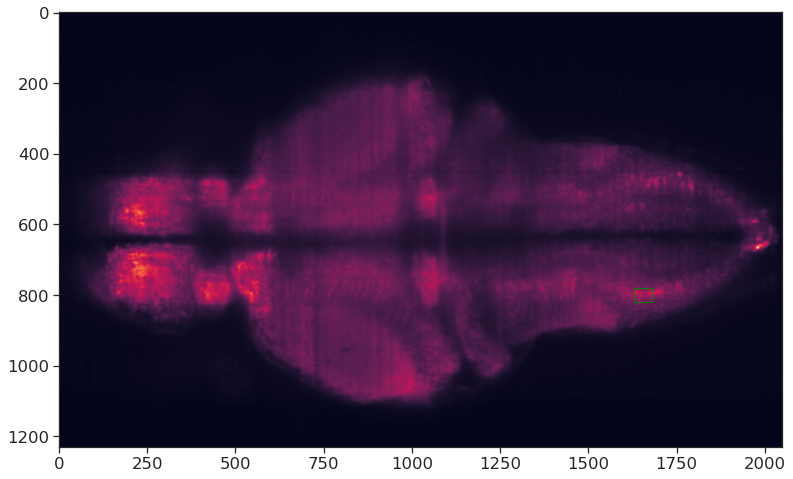

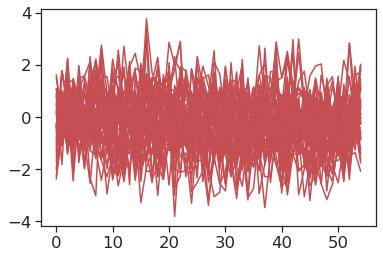

In [72]:
fig, ax = plt.subplots(figsize=(20, 8))
ax.imshow(brain_map[22])
x_1, y_1, x_2, y_2 = (780, 1630, 820, 1680)
ax.add_patch(
     patches.Rectangle(
        (y_1, x_1),
        y_2 - y_1,
        x_2 - x_1,
        edgecolor = 'green',
        facecolor = 'red',
        fill=False
     ) )
plt.show()

idx_ = (A_center[:,0]==22) & (A_center[:,1]>x_1) & (A_center[:,1]<x_2) & (A_center[:,2]>y_1) & (A_center[:,1]<y_2)

# plt.plot((motor_resp[idx_]/motor_resp[idx_].std(axis=-1, keepdims=True)).mean(axis=0), '-k')
# plt.plot((mix_motor_resp[idx_]/mix_motor_resp[idx_].std(axis=-1, keepdims=True)).mean(axis=0), '-r')
plt.plot((pulse_resp[idx_]/pulse_resp[idx_].std(axis=-1, keepdims=True)).T, '-r')
plt.show()